In [1]:
!pip install -q rasterstats
!pip install -q odc-stac -U

In [2]:
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import numpy as np
import rasterstats
import rioxarray as rxr
import rasterio
import adlfs
import contextily as ctx
import sys
sys.path.append('../sar_snowmelt_timing')
import s1_rtc_bs_utils
import fsspec
from pathlib import Path


In [3]:
#from dask.distributed import Client, LocalCluster
#cluster = LocalCluster(processes=False, n_workers=4, local_directory='/tmp')
#client = Client(cluster)
#client

In [4]:
import dask_gateway
cluster = dask_gateway.GatewayCluster()
client = cluster.get_client()
cluster.adapt(minimum=90, maximum=100)
print(client.dashboard_link)

https://pccompute.westeurope.cloudapp.azure.com/compute/services/dask-gateway/clusters/prod.4eb58a58fa174e33a29ba028c8281398/status


In [5]:
gf = gpd.read_file('https://github.com/scottyhq/snotel/raw/main/snotel-sites.geojson')

In [6]:
snotel_gf = gf[gf.isActive==True]
snotel_gf = snotel_gf[(snotel_gf.beginDate<'2015-01-01') & (snotel_gf.endDate>'2022-01-01')]
snotel_gf = snotel_gf[snotel_gf.state!='Alaska']

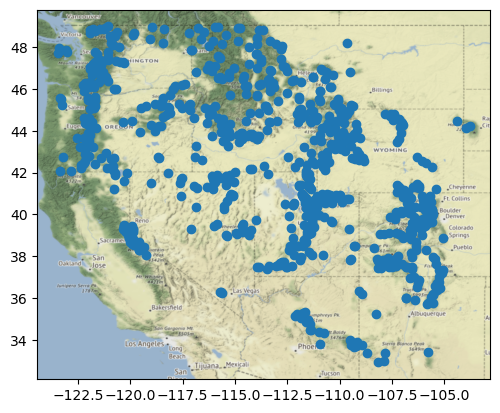

In [7]:
f,ax=plt.subplots()
snotel_gf.plot(ax=ax)
ctx.add_basemap(ax=ax, crs=snotel_gf.crs, source=ctx.providers.Stamen.Terrain, attribution=False)

In [8]:
years = [2015,2016,2017,2018,2019,2020,2021,2022]
#years = [2016,2017,2018,2019,2020,2021,2022]
#years = [2017,2018,2019,2020,2021,2022]
max_swe_years = [f'max_swe_{year}' for year in years]

In [9]:
%%time
my_file = Path("snotel_gf.geojson")
if my_file.is_file():
    snotel_gf = gpd.read_file('snotel_gf.geojson')
else:
    for i,row in snotel_gf.iterrows():
        try:
            snotel_data = pd.read_parquet(f'https://github.com/scottyhq/snotel/raw/main/parquet/{row.code}.parquet').loc[slice(f'{years[0]}-02-01',f'{years[-1]}-09-30')]
            dates = snotel_data.groupby(snotel_data.index.year).idxmax()['WTEQ']
        #print(dates)
            if len(dates)==len(years):
                snotel_gf.loc[i,max_swe_years] = dates.values
        except:
            pass
        
        for year in years:
            snotel_gf[f'max_swe_{year}'] = pd.to_datetime(snotel_gf[f'max_swe_{year}']).dt.dayofyear
            
        snotel_gf.to_file("snotel_gf.geojson", driver='GeoJSON')

CPU times: user 101 ms, sys: 5.06 ms, total: 106 ms
Wall time: 98.2 ms


In [10]:
code = '679_WA_SNTL'
#code = '475_UT_SNTL'
#code = '395_OR_SNTL'
#code = '811_NV_SNTL'
#code = '1146_UT_SNTL'
#code = '665_NM_SNTL'
#code = '842_CO_SNTL'
#code = '478_WA_SNTL'

snotel_row = snotel_gf[snotel_gf.code==code]

In [11]:
aoi = rxr.open_rasterio(f"https://snowmelt.blob.core.windows.net/snowmelt/eric/MGRS/{snotel_row.mgrs.values[0]}/runoff_onset_{snotel_row.mgrs.values[0]}_2015_median_40m.tif")

In [12]:
snotel_row_proj = snotel_row.to_crs(aoi.rio.crs)

In [13]:
buffer = 500
snotel_row_proj_buff = gpd.GeoDataFrame(snotel_row_proj,geometry=snotel_row_proj.buffer(buffer))

In [14]:
snotel_data = pd.read_parquet(f'https://github.com/scottyhq/snotel/raw/main/parquet/{code}.parquet').loc[slice(f'{years[0]}-01-01',f'{years[-1]}-12-31')]

In [15]:
snotel_row_proj_buff

,code,name,elevation_m,latitude,longitude,county,state,beginDate,endDate,isActive,mgrs,timeseries,max_swe_2017,max_swe_2018,max_swe_2019,max_swe_2020,max_swe_2021,max_swe_2022,geometry
517,679_WA_SNTL,Paradise,1563.624023,46.78265,-121.74765,Pierce,Washington,1979-10-01,2100-01-01,True,10TES,True,123.0,111.0,110.0,97.0,110.0,136.0,"POLYGON ((596095.572 5181772.683, 596093.164 5..."


In [16]:
# f,ax=plt.subplots(len(years),2,figsize=(12,18),gridspec_kw={'width_ratios': [1, 4]})

# for i,year in enumerate(years):
#     aoi = rxr.open_rasterio(f"https://snowmelt.blob.core.windows.net/snowmelt/eric/MGRS/{snotel_row.mgrs.values[0]}/runoff_onset_{snotel_row.mgrs.values[0]}_{year}_median_40m.tif")

#     snotel_row_proj_buff.boundary.plot(ax=ax[i,0],color='red')
#     aoi.plot(ax=ax[i,0],vmin=80,vmax=200)
#     ctx.add_basemap(ax=ax[i,0], crs=snotel_row_proj_buff.crs, source=ctx.providers.Stamen.Terrain, attribution=False)

#     ax[i,0].set_xlim([snotel_row_proj_buff.total_bounds[0]-500,snotel_row_proj_buff.total_bounds[2]+500])
#     ax[i,0].set_ylim([snotel_row_proj_buff.total_bounds[1]-500,snotel_row_proj_buff.total_bounds[3]+500])
#     ax[i,0].set_title(f'{year}')

#     snotel_data_thisyear = snotel_data['WTEQ'].loc[slice(f'{year}-01-01',f'{year}-12-31')]

#     snotel_data_thisyear.plot(ax=ax[i,1],color='blue')


#    #peak_swe = pd.to_datetime(f'{year*1000}{snotel_row_proj_buff[f'max_swe_{year}']}', format = "%Y%j")
#     ax[i,1].vlines(x=snotel_data_thisyear.idxmax(),ymin=snotel_data_thisyear.min(),ymax=snotel_data_thisyear.max()+snotel_data_thisyear.max()*0.1,linestyle='dashed',color='blue')

# plt.tight_layout()

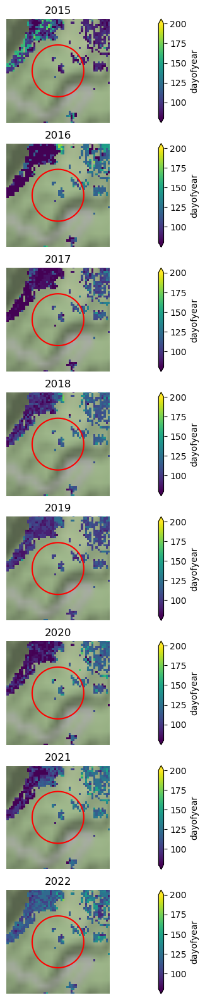

In [17]:
f,ax = plt.subplots(len(years),1,figsize=(20,20))

for i,year in enumerate(years):
    aoi = rxr.open_rasterio(f"https://snowmelt.blob.core.windows.net/snowmelt/eric/MGRS/{snotel_row.mgrs.values[0]}/runoff_onset_{snotel_row.mgrs.values[0]}_{year}_median_40m.tif")

    snotel_row_proj_buff.boundary.plot(ax=ax[i],color='red')
    aoi.where(aoi>0).plot(ax=ax[i],vmin=80,vmax=200)
    ctx.add_basemap(ax=ax[i], crs=snotel_row_proj_buff.crs, source=ctx.providers.Stamen.Terrain, attribution=False)

    ax[i].set_xlim([snotel_row_proj_buff.total_bounds[0]-buffer,snotel_row_proj_buff.total_bounds[2]+buffer])
    ax[i].set_ylim([snotel_row_proj_buff.total_bounds[1]-buffer,snotel_row_proj_buff.total_bounds[3]+buffer])
    ax[i].set_title(f'{year}')
    ax[i].axis('off')

In [18]:
url = 'https://github.com/scottyhq/mgrs/raw/main/MGRS_LAND.parquet' # Scott created an MGRS parquet file here https://github.com/scottyhq/mgrs
with fsspec.open(url) as file:
    mgrs_gdf = gpd.read_parquet(file)

In [19]:
bbox_gdf = mgrs_gdf[mgrs_gdf.tile==snotel_row_proj_buff.mgrs.values[0]]
resolution = 10
ts_ds = s1_rtc_bs_utils.get_s1_rtc_stac_odc_pc(bbox_gdf,start_time='2015-01-01',end_time='2022-12-31',resolution=resolution,epsg=f'EPSG:{bbox_gdf.epsg.values[0]}')

In [20]:
extent = snotel_row_proj_buff.centroid.buffer(buffer).total_bounds

In [21]:
ts_ds_extent = ts_ds.sel(x=slice(extent[0],extent[2]),y=slice(extent[3],extent[1]))

In [22]:
%%time 
ts_ds_clip = ts_ds_extent.rio.clip(snotel_row_proj_buff.geometry).compute() # maybe.compute() here

CPU times: user 1min 41s, sys: 7.89 s, total: 1min 49s
Wall time: 3min 17s


In [23]:
classes = [ # page 13 of https://esa-worldcover.s3.amazonaws.com/v100/2020/docs/WorldCover_PUM_V1.0.pdf
#    10, # treecover
    20, # shrubland
    30, # grassland
    40, # cropland
#    50, # built-up
    60, #bare / sparse vegetation
    70, # snow and ice
#    80, # permanent water bodies
    90, # herbaceous wetlands
    95, # mangroves
    100 # loss and lichen
]
worldcover = s1_rtc_bs_utils.get_worldcover(ts_ds_clip)
ts_ds_clip = ts_ds_clip.where(worldcover.isin(classes))

In [24]:
#ts_ds_clip

In [25]:
#ts_ds_clip_group = ts_ds_clip.groupby('sat:relative_orbit').mean(dim=['x','y'])

In [26]:
#ts_ds_clip_group

In [27]:
#ts_ds_clip

[ 13  35  64 115 137]
For 2015, SNOTEL max SWE observed on 2015-04-15 00:00:00 and SAR derived backscatter minima of 2015-04-01 02:01:36.897274112
[ 13  35  64 115 137]
For 2016, SNOTEL max SWE observed on 2016-04-09 00:00:00 and SAR derived backscatter minima of 2016-04-10 14:21:25.309671936
[ 13  35  64 115 137]
For 2017, SNOTEL max SWE observed on 2017-05-03 00:00:00 and SAR derived backscatter minima of 2017-04-27 01:52:51.076410112
[ 13  35  64 115 137]
For 2018, SNOTEL max SWE observed on 2018-04-21 00:00:00 and SAR derived backscatter minima of 2018-04-30 14:21:08.840805888
[ 13  35  64 115 137]
For 2019, SNOTEL max SWE observed on 2019-04-20 00:00:00 and SAR derived backscatter minima of 2019-04-11 20:11:20.177646080
[ 13  35  64 115 137]
For 2020, SNOTEL max SWE observed on 2020-04-06 00:00:00 and SAR derived backscatter minima of 2020-04-16 02:01:32.294071040
[ 13  35  64 115 137]
For 2021, SNOTEL max SWE observed on 2021-04-20 00:00:00 and SAR derived backscatter minima of 2

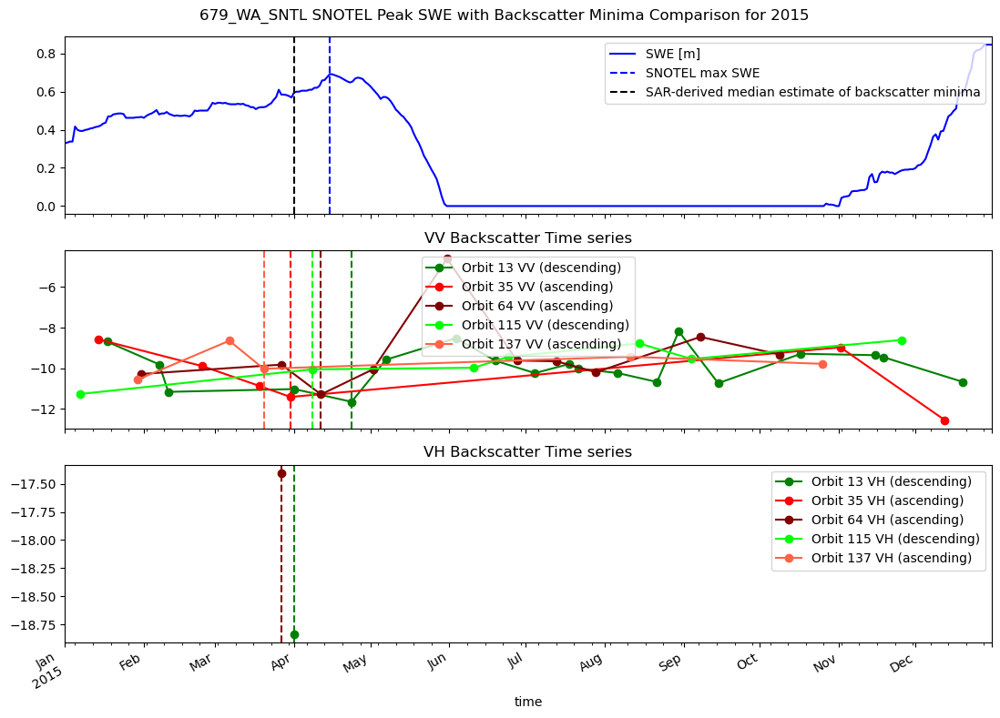

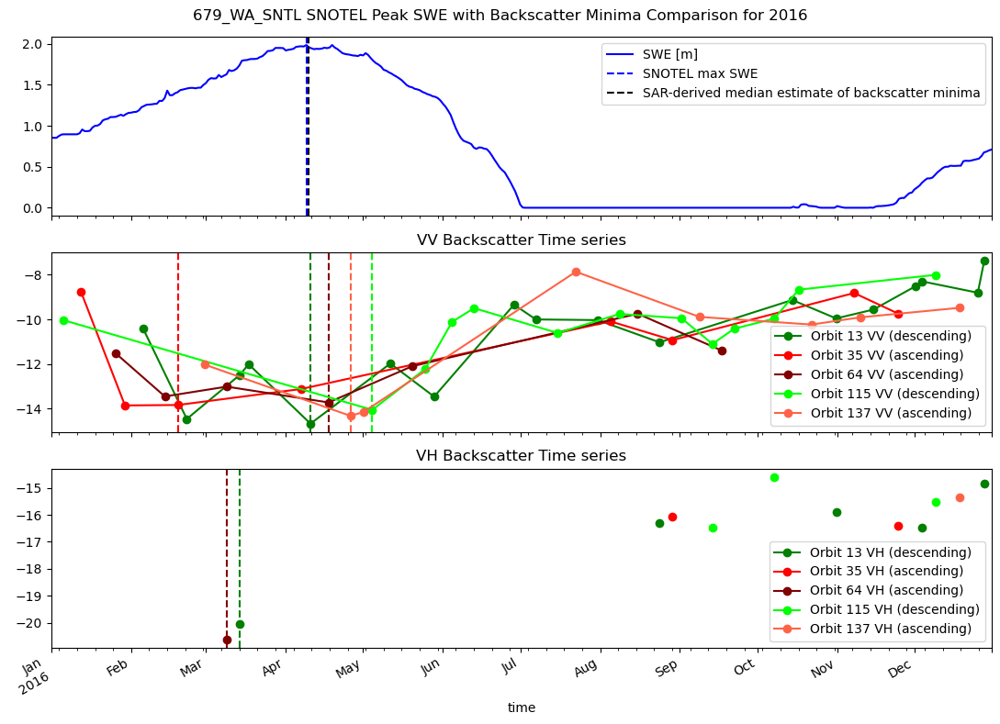

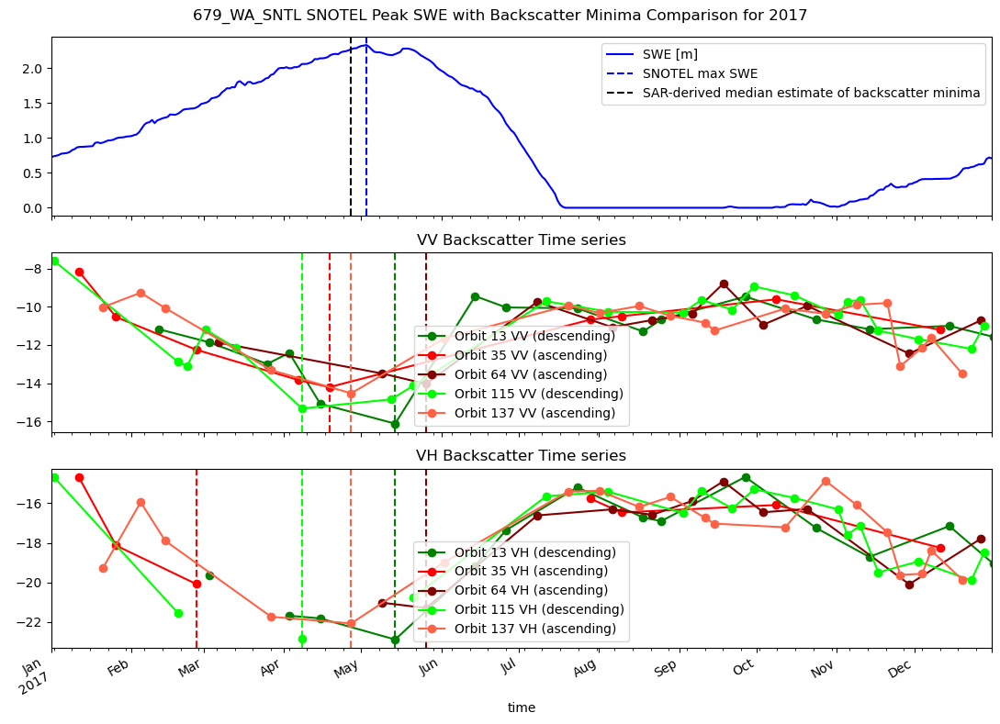

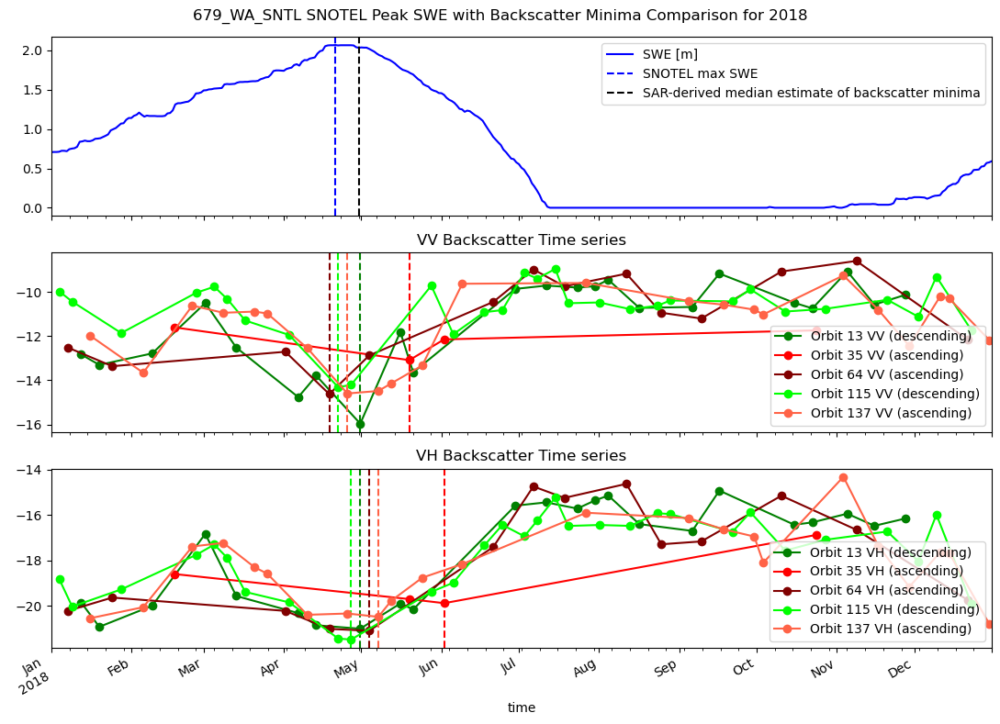

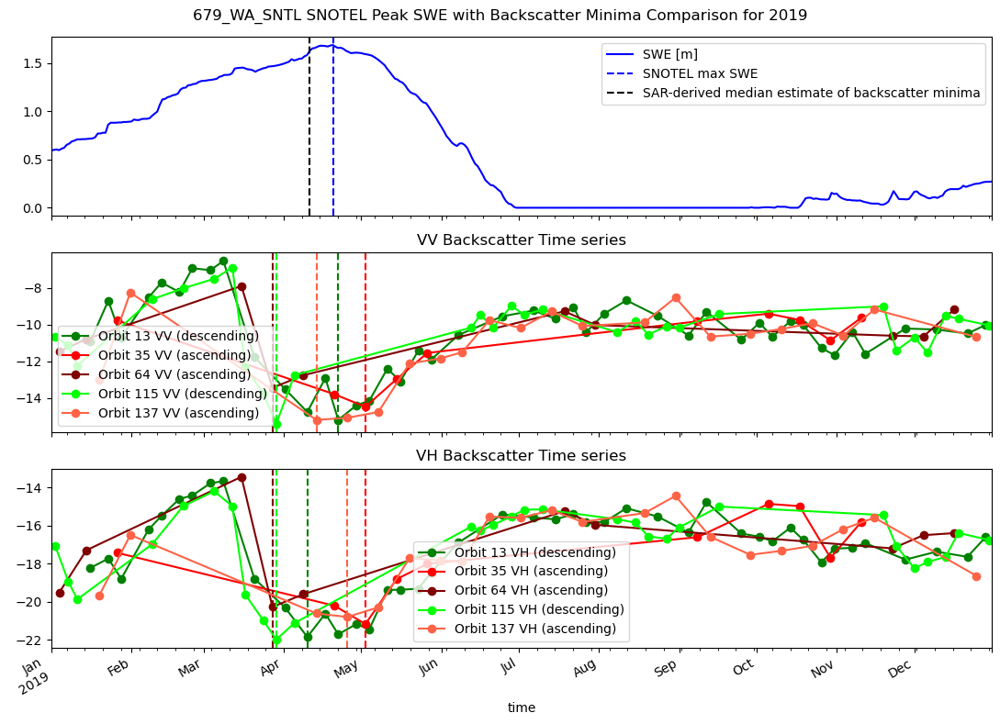

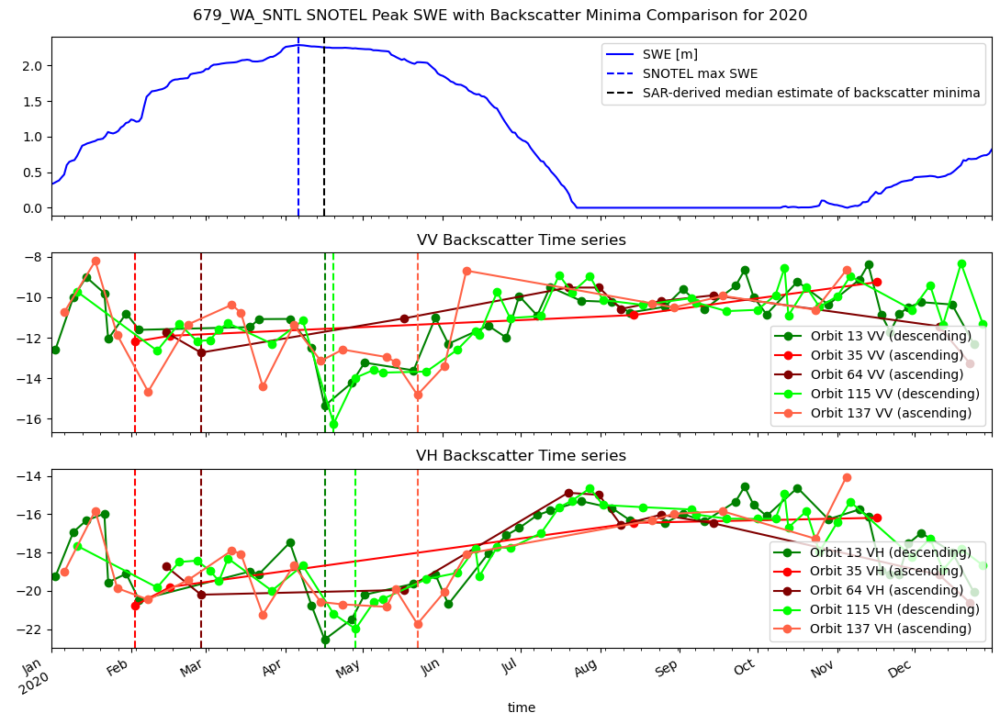

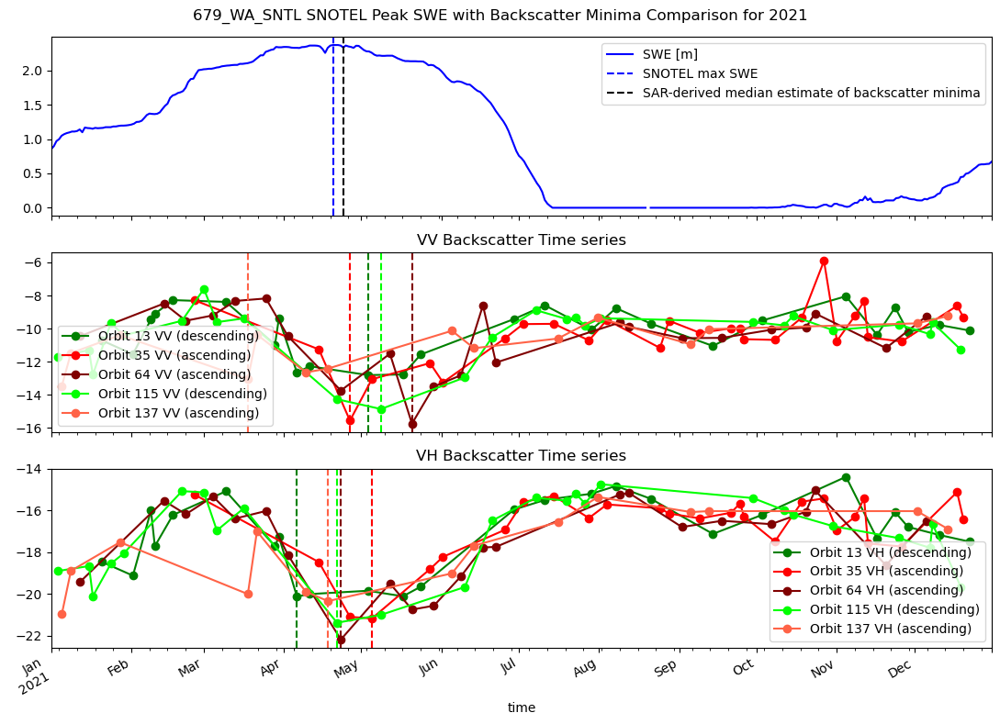

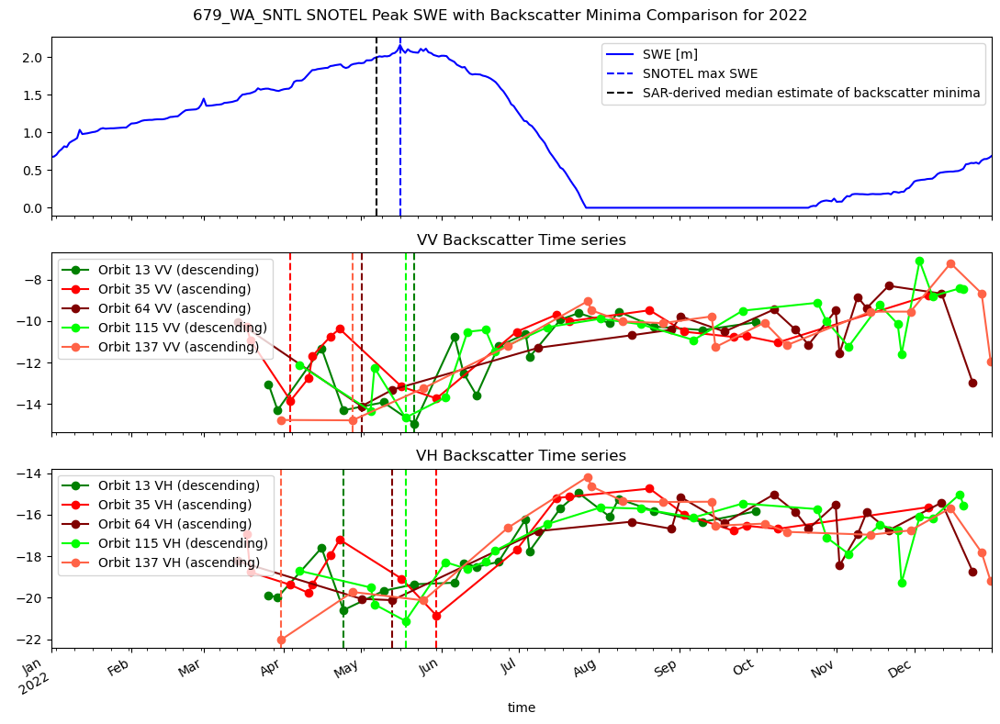

In [31]:
for year in years:
    f,ax=plt.subplots(3,1,figsize=(11,8),sharex=True)
    
    f.suptitle(f'{code} SNOTEL Peak SWE with Backscatter Minima Comparison for {year}')
    colors1 = iter(['red','maroon','tomato','lightcoral','rosybrown'])
    colors2 = iter(['green','lime','yellowgreen','mediumspringgreen','aquamarine'])


    snotel_data_thisyear = snotel_data['WTEQ'].loc[slice(f'{year}-01-01',f'{year}-12-31')]
    snotel_data_thisyear.plot(ax=ax[0],color='blue',label=f'SWE [m]')
    
    swe_max = snotel_data_thisyear.loc[slice(f'{year}-02-01',f'{year}-07-31')].idxmax()
    
    ax[0].axvline(x=swe_max,linestyle='dashed',color='blue',label=f'SNOTEL max SWE')


    ts_ds_clip_year = ts_ds_clip.loc[slice(f'{year}-01-01',f'{year}-12-31')].dropna('time',how='all')

    orbits = s1_rtc_bs_utils.get_orbits_with_melt_season_coverage(ts_ds_clip_year,num_acquisitions_during_melt_season=1)
    print(orbits)
    ts_ds_clip_year = ts_ds_clip_year[ts_ds_clip_year['sat:relative_orbit'].isin(orbits)]
    
    estimates = []
    
    for orbit in np.unique(ts_ds_clip_year['sat:relative_orbit']):
        single_orbit = ts_ds_clip_year[ts_ds_clip_year['sat:relative_orbit']==orbit].median(dim=['x','y']) # change to mean or median?##########################################################################################################
        single_orbit_db = 10*np.log10(single_orbit)
        #single_orbit_db = single_orbit

        #color1 = next(colors1)
        #color2 = next(colors2) 

        asc_or_desc = single_orbit['sat:orbit_state'][0]

        if asc_or_desc == 'ascending':
            color = next(colors1)
        else:
            color = next(colors2)

        single_orbit_db.sel(band='vv').plot.line(ax=ax[1],label=f'Orbit {orbit} VV ({asc_or_desc})',linestyle='-',marker='o',color=color)
        single_orbit_db.sel(band='vh').plot.line(ax=ax[2],label=f'Orbit {orbit} VH ({asc_or_desc})',linestyle='-',marker='o',color=color)

        vv_estimate = single_orbit_db.sel(band='vv').loc[slice(f'{year}-02-01',f'{year}-07-31')].idxmin().values
        vh_estimate = single_orbit_db.sel(band='vh').loc[slice(f'{year}-02-01',f'{year}-07-31')].idxmin().values
        
        estimates.append(vv_estimate)
        estimates.append(vh_estimate)
        
        ax[1].axvline(x=vv_estimate,linestyle='dashed',color=color) #,ymin=-12,ymax=-4,
        ax[2].axvline(x=vh_estimate,linestyle='dashed',color=color) #,ymin=-17,ymax=-12 #using axvline gives seperate ticks
        
    median_estimate = pd.to_datetime(pd.Series(estimates)).median()
    ax[0].axvline(x=median_estimate,linestyle='dashed',color='black',label=f'SAR-derived median estimate of backscatter minima')
    
    ax[0].legend()
    ax[1].legend()
    ax[2].legend()

    ax[1].set_title('VV Backscatter Time series')
    ax[2].set_title('VH Backscatter Time series')
    
    print(f'For {year}, SNOTEL max SWE observed on {swe_max} and SAR derived backscatter minima of {median_estimate}')

        #peak_swe = pd.to_datetime(f'{year*1000}{snotel_row_proj_buff[f'max_swe_{year}']}', format = "%Y%j")

    plt.tight_layout()